In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow import keras
import tensorflow as tf

import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

In [2]:
data=pd.read_csv("/home/hemanth/Documents/DeepLearning/MLP/cancer_reg.csv",encoding='latin-1')

In [3]:
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [4]:
data.tail()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,"(45201, 48021.6]",44.2,...,54.9,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,"(48021.6, 51046.4]",30.4,...,53.3,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,"(51046.4, 54545.6]",30.9,...,52.6,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,"(48021.6, 51046.4]",39.0,...,56.3,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938
3046,1962.667684,48,213.6,453.549422,41193,37030,13.9,0.000000,"(40362.7, 42724.4]",26.2,...,60.3,22.9,25.1,12.6,70.098132,16.590100,3.177753,1.356457,56.040242,8.981723


In [7]:
data.isna().sum()

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     609
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

In [8]:
data.shape

(3047, 34)

In [9]:
data['PctSomeCol18_24'].value_counts()

43.0    10
42.1     8
42.3     8
36.1     7
32.3     7
        ..
50.1     1
24.8     1
19.2     1
18.7     1
64.0     1
Name: PctSomeCol18_24, Length: 343, dtype: int64

In [10]:
data['PctEmployed16_Over'].value_counts()

57.9    20
51.9    20
48.9    20
54.2    19
59.7    19
        ..
30.9     1
35.4     1
30.3     1
32.1     1
74.4     1
Name: PctEmployed16_Over, Length: 409, dtype: int64

In [11]:
data['PctPrivateCoverageAlone'].value_counts()

53.0    16
45.5    14
49.6    14
53.8    14
49.5    14
        ..
30.8     1
71.1     1
27.6     1
70.2     1
28.4     1
Name: PctPrivateCoverageAlone, Length: 459, dtype: int64

In [12]:
data['PctEmployed16_Over']=data['PctEmployed16_Over'].fillna(data['PctEmployed16_Over'].mean())

In [13]:
data['PctPrivateCoverageAlone']=data['PctPrivateCoverageAlone'].fillna(data['PctPrivateCoverageAlone'].mean())
data['PctSomeCol18_24']=data['PctSomeCol18_24'].fillna(data['PctSomeCol18_24'].mean())

In [14]:
data.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,...,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,...,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,...,9.018885,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,...,43.100000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,...,48.453774,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,...,53.800000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [16]:
data.isna().sum()

avgAnnCount                0
avgDeathsPerYear           0
TARGET_deathRate           0
incidenceRate              0
medIncome                  0
popEst2015                 0
povertyPercent             0
studyPerCap                0
binnedInc                  0
MedianAge                  0
MedianAgeMale              0
MedianAgeFemale            0
Geography                  0
AvgHouseholdSize           0
PercentMarried             0
PctNoHS18_24               0
PctHS18_24                 0
PctSomeCol18_24            0
PctBachDeg18_24            0
PctHS25_Over               0
PctBachDeg25_Over          0
PctEmployed16_Over         0
PctUnemployed16_Over       0
PctPrivateCoverage         0
PctPrivateCoverageAlone    0
PctEmpPrivCoverage         0
PctPublicCoverage          0
PctPublicCoverageAlone     0
PctWhite                   0
PctBlack                   0
PctAsian                   0
PctOtherRace               0
PctMarriedHouseholds       0
BirthRate                  0
dtype: int64

In [17]:
data1=data.drop(['binnedInc','Geography'], axis = 1) 

In [18]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   MedianAge                3047 non-null   float64
 9   MedianAgeMale            3047 non-null   float64
 10  MedianAgeFemale          3047 non-null   float64
 11  AvgHouseholdSize         3047 non-null   float64
 12  PercentMarried           3047 non-null   float64
 13  PctNoHS18_24             3047 non-null   float64
 14  PctHS18_24              

In [19]:
data1['BirthRate'].value_counts()

0.000000     4
7.142857     3
4.361371     2
3.095975     2
6.140351     2
            ..
6.776557     1
15.434084    1
6.857756     1
3.908484     1
5.738255     1
Name: BirthRate, Length: 3019, dtype: int64

In [20]:
data1.columns

Index(['avgAnnCount', 'avgDeathsPerYear', 'TARGET_deathRate', 'incidenceRate',
       'medIncome', 'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeMale', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctSomeCol18_24',
       'PctBachDeg18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPrivateCoverageAlone', 'PctEmpPrivCoverage', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctWhite', 'PctBlack', 'PctAsian',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')

In [21]:
data1.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,48.453774,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,53.800000,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,43.500000,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,40.300000,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,43.900000,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [22]:
data1['TARGET_deathRate'].value_counts()

184.3    11
182.8    10
176.4    10
179.9    10
173.6    10
         ..
229.5     1
121.0     1
147.0     1
236.4     1
126.7     1
Name: TARGET_deathRate, Length: 1053, dtype: int64

In [23]:
train_dataset=data.sample(frac=0.8,random_state=0)
test_dataset=data.drop(train_dataset.index)

In [24]:
print(train_dataset.shape)
print(test_dataset.shape)

(2438, 34)
(609, 34)


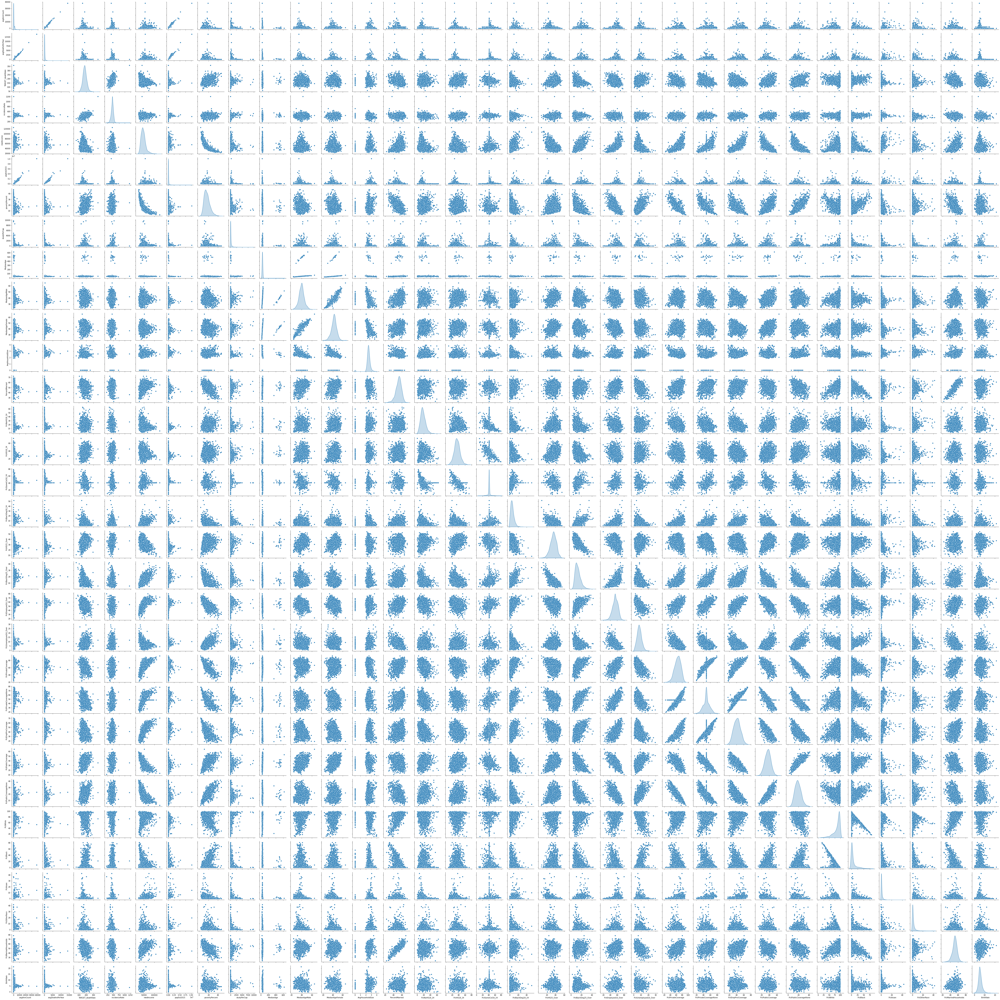

In [25]:
sns.pairplot(train_dataset[['avgAnnCount', 'avgDeathsPerYear', 'TARGET_deathRate', 'incidenceRate',
       'medIncome', 'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeMale', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctSomeCol18_24',
       'PctBachDeg18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPrivateCoverageAlone', 'PctEmpPrivCoverage', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctWhite', 'PctBlack', 'PctAsian',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate']],diag_kind='kde')

In [35]:
x=data1.drop(['TARGET_deathRate'],axis=1)

In [36]:
x.head()

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,489.8,61898,260131,11.2,499.748204,39.3,36.9,41.7,...,48.453774,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,411.6,48127,43269,18.6,23.111234,33.0,32.2,33.7,...,53.800000,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,349.7,49348,21026,14.6,47.560164,45.0,44.0,45.8,...,43.500000,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,430.4,44243,75882,17.1,342.637253,42.8,42.2,43.4,...,40.300000,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,350.1,49955,10321,12.5,0.000000,48.3,47.8,48.9,...,43.900000,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [37]:
y=data1['TARGET_deathRate']

In [39]:
data1['TARGET_deathRate'].value_counts()

184.3    11
182.8    10
176.4    10
179.9    10
173.6    10
         ..
229.5     1
121.0     1
147.0     1
236.4     1
126.7     1
Name: TARGET_deathRate, Length: 1053, dtype: int64

In [48]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(x,y,test_size=0.25,random_state=5)

### Logistic Regression

In [49]:
from sklearn.linear_model import LinearRegression
lg=LinearRegression()

In [50]:
lg.fit(X_train,Y_train)

LinearRegression()

In [51]:
print(lg.score(X_train,Y_train))
print(lg.score(X_test,Y_test))

0.5400991565123587
0.46321341287964013


In [53]:
from sklearn.metrics import r2_score
lg_pred=lg.predict(X_test)

In [55]:
lin_reg_score=r2_score(Y_test,lg_pred)*100
print("Accuracy score for LR :",lin_reg_score)

Accuracy score for LR : 46.32134128796401


### Ridge Regression

In [56]:
from sklearn.linear_model import Ridge
rg=Ridge()

In [57]:
rg.fit(X_train,Y_train)

Ridge()

In [59]:
print(rg.score(X_train,Y_train))
print(rg.score(X_test,Y_test))

0.5400991556062219
0.46321908270920464


In [61]:
rg_pred=rg.predict(X_test)

In [64]:
rg_score=r2_score(Y_test,rg_pred)*100
print("Accuracy score of Ridge:",rg_score)

Accuracy score of Ridge: 46.32190827092047


### Lasso

In [65]:
from sklearn.linear_model import Lasso
ls=Lasso()

In [66]:
ls.fit(X_train,Y_train)

Lasso()

In [67]:
print(ls.score(X_train,Y_train))
print(ls.score(X_test,Y_test))

0.5358035602854542
0.46984504857293774


In [68]:
ls_pred=ls.predict(X_test)

In [70]:
ls_score=r2_score(Y_test,ls_pred)*100
print("Accuracy score of Lasso:",ls_score)

Accuracy score of Lasso: 46.98450485729377


### SVR

In [76]:
from sklearn.svm import SVR
svr=SVR()

In [77]:
svr.fit(X_train,Y_train)

SVR()

In [78]:
print(svr.score(X_train,Y_train))
print(svr.score(X_test,Y_test))

0.06123056325886189
0.04239828774327925


In [79]:
svr_pred=svr.predict(X_test)

In [81]:
svr_score=r2_score(Y_test,svr_pred)*100
print("Accuracy score of SVR:",svr_score)

Accuracy score of SVR: 4.2398287743279255


### DT

In [82]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()

In [83]:
dt.fit(X_train,Y_train)

DecisionTreeRegressor()

In [84]:
print(dt.score(X_train,Y_train))
print(dt.score(X_test,Y_test))

1.0
0.0787178728873823


In [85]:
dt_pred=dt.predict(X_test)

In [87]:
dt_score=r2_score(Y_test,dt_pred)*100
print("Accuracy Score Of DecissionTree:",dt_score)

Accuracy Score Of DecissionTree: 7.87178728873823


### RF

In [88]:
from sklearn.ensemble import RandomForestRegressor

In [89]:
rf=RandomForestRegressor()

In [90]:
rf.fit(X_train,Y_train)

RandomForestRegressor()

In [91]:
print(rf.score(X_train,Y_train))
print(rf.score(X_test,Y_test))

0.9366423549510445
0.49329218221704574


In [92]:
rf_pred=rf.predict(X_test)

In [97]:
rf_score=r2_score(Y_test,rf_pred)*100

In [98]:
print("Accuracy Score of RandomForest:",rf_score)

Accuracy Score of RandomForest: 49.32921822170457


In [100]:
pd.DataFrame({"Model Names":['Linear Reg','Ridge Reg','Lasso Reg','Support Vector Reg','DT Reg','RandomForest Reg'],
            "Accuracy socre":[lin_reg_score,rg_score,ls_score,svr_score,dt_score,rf_score]})

,Model Names,Accuracy socre
0,Linear Reg,46.321341
1,Ridge Reg,46.321908
2,Lasso Reg,46.984505
3,Support Vector Reg,4.239829
4,DT Reg,7.871787
5,RandomForest Reg,49.329218


### Normalizing The Data

In [134]:
from sklearn.preprocessing import RobustScaler
ss=RobustScaler()

In [135]:
features=RobustScaler().fit(x).transform(x)
features

array([[ 2.77375566,  3.37190083,  0.59868832, ...,  0.54031213,
         0.15541457,  0.37386265],
       [ 0.00452489,  0.07438017, -0.69280631, ...,  1.54832406,
        -0.82512883, -0.5315646 ],
       [-0.1561086 , -0.09090909, -1.71510193, ...,  1.02038725,
         0.36358779, -0.8376138 ],
       ...,
       [ 4.0535468 , -0.12396694,  0.        , ...,  2.5783675 ,
         0.45649585,  1.2309317 ],
       [ 4.0535468 , -0.07438017,  0.        , ...,  0.69344244,
         0.89284969,  1.11621376],
       [ 4.0535468 , -0.10743802,  0.        , ...,  0.28164199,
         0.57262333,  1.82544419]])

In [136]:
X_train,X_test,Y_train,Y_test=train_test_split(features,y,test_size=0.20,random_state=0)

### Logistic Regression

In [137]:
lg_n=LinearRegression()

In [138]:
lg_n.fit(X_train,Y_train)

LinearRegression()

In [139]:
print(lg_n.score(X_train,Y_train))
print(lg_n.score(X_test,Y_test))

0.5126700589468681
0.5590795951747536


In [140]:
lg_n_pred=lg_n.predict(X_test)

In [142]:
lg_n_score=r2_score(Y_test,lg_n_pred)*100
print("Normalied LinearRegression Accuracy Score:",lg_n_score)

Normalied LinearRegression Accuracy Score: 55.90795951747536


### Ridge

In [143]:
rg_n=Ridge()

In [144]:
rg_n.fit(X_train,Y_train)

Ridge()

In [145]:
print(rg_n.score(X_train,Y_train))
print(rg_n.score(X_test,Y_test))

0.5126672049607561
0.5592140835150369


In [146]:
rg_n_pred=rg_n.predict(X_test)

In [147]:
rg_n_score=r2_score(Y_test,rg_n_pred)*100
print("Normalied Ridge Regression Accuracy Score:",rg_n_score)

Normalied Ridge Regression Accuracy Score: 55.921408351503686


### Lasso

In [148]:
ls_n=Lasso()

In [149]:
ls_n.fit(X_train,Y_train)

Lasso()

In [150]:
print(ls_n.score(X_train,Y_train))
print(ls_n.score(X_test,Y_test))

0.48324055849773984
0.5353916386756196


In [151]:
ls_n_pred=ls_n.predict(X_test)

In [152]:
ls_n_score=r2_score(Y_test,ls_n_pred)*100
print("Normalied Lasso Regression Accuracy Score:",ls_n_score)

Normalied Ridge Regression Accuracy Score: 53.53916386756195


### SVR

In [153]:
svr_n=SVR(kernel='linear')

In [154]:
svr_n.fit(X_train,Y_train)

SVR(kernel='linear')

In [155]:
print(svr_n.score(X_train,Y_train))
print(svr_n.score(X_test,Y_test))

0.5045887303389445
0.5595585448667495


In [156]:
svr_n_pred=svr_n.predict(X_test)

In [157]:
svr_n_score=r2_score(Y_test,svr_n_pred)*100
print("Normalied SV Regression Accuracy Score:",svr_n_score)

Normalied SV Regression Accuracy Score: 55.95585448667495


### Decission Tree

In [158]:
dt_n=DecisionTreeRegressor()

In [159]:
dt_n.fit(X_train,Y_train)

DecisionTreeRegressor()

In [160]:
print(dt_n.score(X_train,Y_train))
print(dt_n.score(X_test,Y_test))

1.0
0.1342446973708289


In [161]:
dt_n_pred=dt_n.predict(X_test)

In [163]:
dt_n_score=r2_score(Y_test,dt_n_pred)*100
print("Normalized Decissiontree Accuracy Score:",dt_n_score)

Normalized Decissiontree Accuracy Score: 13.42446973708289


### RandomForest

In [164]:
rf_n=RandomForestRegressor()

In [165]:
rf_n.fit(X_train,Y_train)

RandomForestRegressor()

In [166]:
print(rf_n.score(X_train,Y_train))
print(rf_n.score(X_test,Y_test))

0.9329434381574182
0.5749018600824547


In [167]:
rf_n_pred=rf_n.predict(X_test)

In [168]:
rf_n_score=r2_score(Y_test,rf_n_pred)*100
print("Nprmalized RandomFores Accuracy Score:",rf_n_score)

Nprmalized RandomFores Accuracy Score: 57.49018600824547


In [169]:
pd.DataFrame({"Model Names":['Linear Reg','Ridge Reg','Lasso Reg','Support Vector Reg','DT Reg','RandomForest Reg'],
            "Accuracy socre":[lg_n_score,rg_n_score,ls_n_score,svr_n_score,dt_n_score,rf_n_score]})

,Model Names,Accuracy socre
0,Linear Reg,55.907960
1,Ridge Reg,55.921408
2,Lasso Reg,53.539164
3,Support Vector Reg,55.955854
4,DT Reg,13.424470
5,RandomForest Reg,57.490186
